In [0]:
# !pip install tensorflow-gpu=='2.1.0rc0'

In [0]:
from __future__ import absolute_import, division, print_function, unicode_literals
import tensorflow as tf
AUTOTUNE = tf.data.experimental.AUTOTUNE
import IPython.display as display
from PIL import Image
import numpy as np
import matplotlib.pyplot as plt
import os

In [3]:
tf.__version__

'2.1.0-rc0'

In [4]:
claz = {0:'plane',1:'tesla',2:'shuttle'}
device_name = tf.test.gpu_device_name()
if device_name != '/device:GPU:0':
  raise SystemError('GPU device not found')
print('Found GPU at: {}'.format(device_name))

Found GPU at: /device:GPU:0


In [5]:
from google.colab import drive
drive.mount('/content/dirve')

Drive already mounted at /content/dirve; to attempt to forcibly remount, call drive.mount("/content/dirve", force_remount=True).


In [0]:
import pathlib
valid_data_dir = '/content/dirve/My Drive/Colab Notebooks/TransferLearningData/test'
train_data_dir = '/content/dirve/My Drive/Colab Notebooks/TransferLearningData/train'
valid_data_dir = pathlib.Path(valid_data_dir)
train_data_dir = pathlib.Path(train_data_dir)

In [7]:
valid_image_count = len(list(valid_data_dir.glob('*/*.jpg')))
train_image_count= len(list(train_data_dir.glob('*/*.jpg')))
print(f'VALID: {valid_image_count}, TRAIN: {train_image_count}')

VALID: 346, TRAIN: 814


In [8]:
CLASS_NAMES = np.array([item.name for item in train_data_dir.glob('*')])
CLASS_NAMES

array(['plane', 'tesla', 'shuttle'], dtype='<U7')

In [0]:
image_generator = tf.keras.preprocessing.image.ImageDataGenerator(rescale=1./255)

In [0]:
BATCH_SIZE = 32
IMG_HEIGHT = 256
IMG_WIDTH = 256
STEPS_PER_EPOCH = np.ceil(train_image_count/BATCH_SIZE)

In [0]:
def draw_charts(history):
  acc = history.history['accuracy']
  val_acc = history.history['val_accuracy']

  loss = history.history['loss']
  val_loss = history.history['val_loss']

  plt.figure(figsize=(8, 8))
  plt.subplot(2, 1, 1)
  plt.plot(acc, label='Training Accuracy')
  plt.plot(val_acc, label='Validation Accuracy')
  plt.legend(loc='lower right')
  plt.ylabel('Accuracy')
  plt.ylim([min(plt.ylim()),1])
  plt.title('Training and Validation Accuracy')

  plt.subplot(2, 1, 2)
  plt.plot(loss, label='Training Loss')
  plt.plot(val_loss, label='Validation Loss')
  plt.legend(loc='upper right')
  plt.ylabel('Cross Entropy')
  plt.ylim([0,1.0])
  plt.title('Training and Validation Loss')
  plt.xlabel('epoch')
  plt.show()

In [12]:
train_data_gen = image_generator.flow_from_directory(directory=str(train_data_dir),
                                                     batch_size=BATCH_SIZE,
                                                     shuffle=True,
                                                     target_size=(IMG_HEIGHT, IMG_WIDTH),
                                                     classes = list(CLASS_NAMES))
valid_data_gen = image_generator.flow_from_directory(directory=str(valid_data_dir),
                                                     target_size=(IMG_HEIGHT, IMG_WIDTH),
                                                     classes = list(CLASS_NAMES))

Found 814 images belonging to 3 classes.
Found 346 images belonging to 3 classes.


In [0]:
def show_batch(image_batch, label_batch):
  plt.figure(figsize=(10,10))
  for n in range(25):
      ax = plt.subplot(5,5,n+1)
      plt.imshow(image_batch[n])
      plt.title(CLASS_NAMES[label_batch[n]==1][0].title())
      plt.axis('off')

In [0]:
image_batch, label_batch = next(train_data_gen)

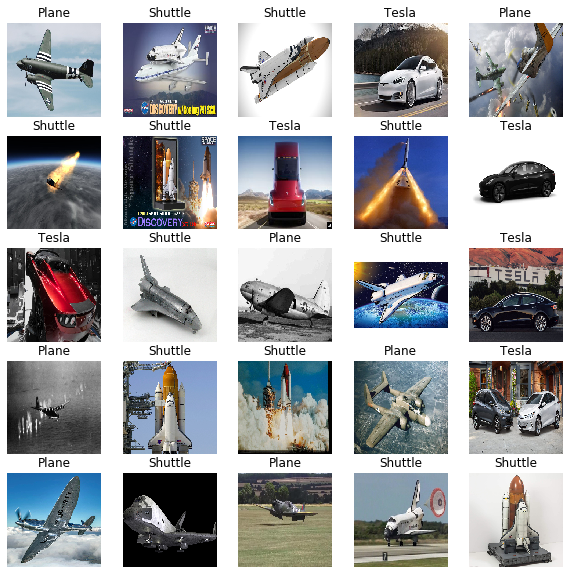

In [15]:
show_batch(image_batch,label_batch)

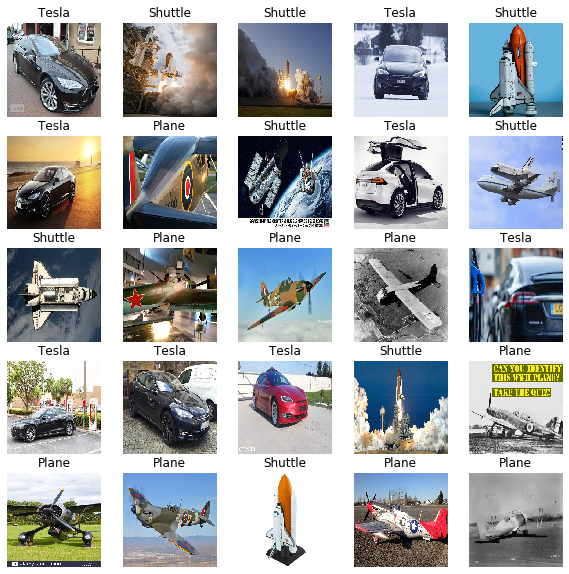

In [16]:
show_batch(*next(valid_data_gen))

In [0]:
keras = tf.keras

In [18]:
IMG_SHAPE = (IMG_HEIGHT, IMG_WIDTH, 3)

base_model = tf.keras.applications.MobileNetV2(input_shape=IMG_SHAPE,
                                               include_top=False,
                                               weights='imagenet')

/usr/local/lib/python3.6/dist-packages/keras_applications/mobilenet_v2.py:294: UserWarning: `input_shape` is undefined or non-square, or `rows` is not in [96, 128, 160, 192, 224]. Weights for input shape (224, 224) will be loaded as the default.
  warnings.warn('`input_shape` is undefined or non-square, '


In [0]:
base_model.trainable = False
image_batch, label_batch = next(train_data_gen)

In [0]:
feature_batch = base_model(image_batch)

In [21]:
global_average_layer = tf.keras.layers.GlobalAveragePooling2D()
feature_batch_average = global_average_layer(feature_batch)
print(feature_batch_average.shape)

(32, 1280)


In [22]:
prediction_layer = keras.layers.Dense(3,activation="softmax")
prediction_batch = prediction_layer(feature_batch_average)
print(prediction_batch.shape)

(32, 3)


10 trainings

In [0]:
model_1 = tf.keras.Sequential([
  base_model,
  global_average_layer,
  prediction_layer
])

In [0]:
base_learning_rate = 0.0001
base_momentum=0.9
model_1.compile(optimizer=tf.keras.optimizers.SGD(lr=base_learning_rate, momentum=base_momentum),
              loss='categorical_crossentropy',
              metrics=['accuracy'])

In [25]:
history = model_1.fit(train_data_gen,
                    epochs=10,
                    validation_data=valid_data_gen)

  ...
    to  
  ['...']
  ...
    to  
  ['...']
Train for 26 steps, validate for 11 steps
Epoch 1/10
 4/26 [===>..........................] - ETA: 25s - loss: 1.0679 - accuracy: 0.4531

/usr/local/lib/python3.6/dist-packages/PIL/Image.py:914: UserWarning: Palette images with Transparency   expressed in bytes should be converted to RGBA images
  'to RGBA images')


26/26 [==============================] - 22s 841ms/step - loss: 1.0924 - accuracy: 0.4398 - val_loss: 1.0056 - val_accuracy: 0.5000
Epoch 2/10
26/26 [==============================] - 19s 713ms/step - loss: 0.9782 - accuracy: 0.5356 - val_loss: 0.8780 - val_accuracy: 0.6301
Epoch 3/10
26/26 [==============================] - 18s 707ms/step - loss: 0.8759 - accuracy: 0.6155 - val_loss: 0.7767 - val_accuracy: 0.7168
Epoch 4/10
26/26 [==============================] - 18s 710ms/step - loss: 0.7936 - accuracy: 0.6744 - val_loss: 0.6955 - val_accuracy: 0.7890
Epoch 5/10
26/26 [==============================] - 19s 717ms/step - loss: 0.7249 - accuracy: 0.7076 - val_loss: 0.6295 - val_accuracy: 0.8179
Epoch 6/10
26/26 [==============================] - 18s 690ms/step - loss: 0.6671 - accuracy: 0.7469 - val_loss: 0.5788 - val_accuracy: 0.8410
Epoch 7/10
26/26 [==============================] - 19s 713ms/step - loss: 0.6182 - accuracy: 0.7727 - val_loss: 0.5335 - val_accuracy: 0.8642
Epoch 8/10

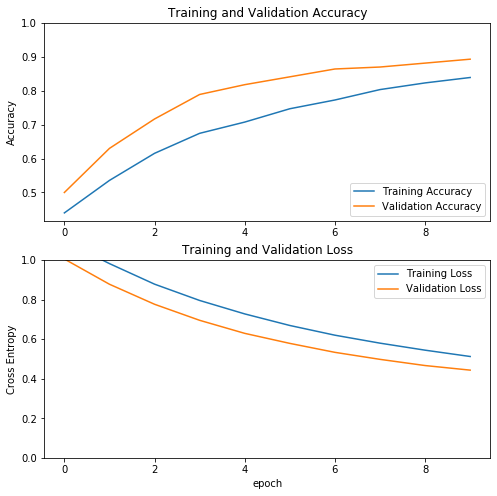

In [26]:
draw_charts(history)

50 trainings

In [0]:
model_2 = tf.keras.Sequential([
  base_model,
  global_average_layer,
  prediction_layer
])

In [0]:
base_learning_rate = 0.0001
base_momentum=0.9
model_2.compile(optimizer=tf.keras.optimizers.SGD(lr=base_learning_rate, momentum=base_momentum),
              loss='categorical_crossentropy',
              metrics=['accuracy'])

In [29]:
history = model_2.fit(train_data_gen,
                    epochs=50,
                    validation_data=valid_data_gen)

  ...
    to  
  ['...']
  ...
    to  
  ['...']
Train for 26 steps, validate for 11 steps
Epoch 1/50
 5/26 [====>.........................] - ETA: 18s - loss: 0.5653 - accuracy: 0.8000

/usr/local/lib/python3.6/dist-packages/PIL/Image.py:914: UserWarning: Palette images with Transparency   expressed in bytes should be converted to RGBA images
  'to RGBA images')


26/26 [==============================] - 21s 801ms/step - loss: 0.4909 - accuracy: 0.8477 - val_loss: 0.4281 - val_accuracy: 0.8960
Epoch 2/50
26/26 [==============================] - 18s 682ms/step - loss: 0.4692 - accuracy: 0.8636 - val_loss: 0.4078 - val_accuracy: 0.8988
Epoch 3/50
26/26 [==============================] - 18s 684ms/step - loss: 0.4495 - accuracy: 0.8698 - val_loss: 0.3889 - val_accuracy: 0.9046
Epoch 4/50
26/26 [==============================] - 17s 666ms/step - loss: 0.4285 - accuracy: 0.8759 - val_loss: 0.3759 - val_accuracy: 0.9046
Epoch 5/50
26/26 [==============================] - 17s 669ms/step - loss: 0.4099 - accuracy: 0.8894 - val_loss: 0.3594 - val_accuracy: 0.9075
Epoch 6/50
26/26 [==============================] - 17s 663ms/step - loss: 0.3947 - accuracy: 0.8943 - val_loss: 0.3456 - val_accuracy: 0.9075
Epoch 7/50
26/26 [==============================] - 18s 687ms/step - loss: 0.3792 - accuracy: 0.8993 - val_loss: 0.3405 - val_accuracy: 0.9075
Epoch 8/50

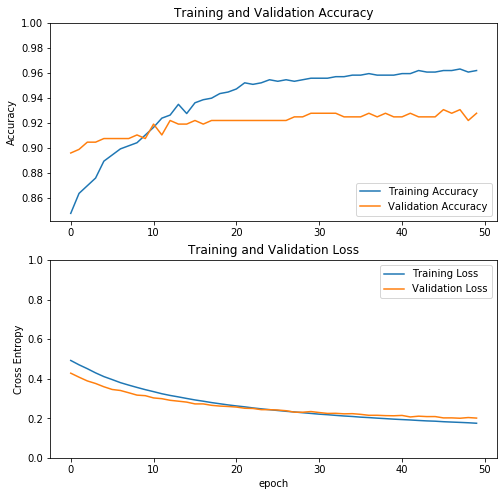

In [30]:
draw_charts(history)

In [0]:
Widzimy że wraz ze wzrostem ilości iteracji `accuracy` już nie rośnie i wacha się wokół maximum, sieć się nasyciła

Not mobile network

In [31]:
model = keras.applications.VGG19(weights = "imagenet", include_top=False, input_shape = (IMG_HEIGHT, IMG_WIDTH, 3))
for layer in model.layers[:5]:
    layer.trainable = False

x = model.output
x = keras.layers.Flatten()(x)
x = keras.layers.Dense(1024, activation="relu")(x)
x = keras.layers.Dropout(0.5)(x)
x = keras.layers.Dense(1024, activation="relu")(x)
predictions = keras.layers.Dense(3, activation="softmax")(x)

model_3 = keras.models.Model(inputs = model.input, outputs = predictions)
model_3.compile(loss = "categorical_crossentropy", optimizer = keras.optimizers.SGD(lr=0.0001, momentum=0.9), metrics=["accuracy"])
history = model_3.fit(train_data_gen,
                    epochs=10,
                    validation_data=valid_data_gen)

  ...
    to  
  ['...']
  ...
    to  
  ['...']
Train for 26 steps, validate for 11 steps
Epoch 1/10


/usr/local/lib/python3.6/dist-packages/PIL/Image.py:914: UserWarning: Palette images with Transparency   expressed in bytes should be converted to RGBA images
  'to RGBA images')


26/26 [==============================] - 43s 2s/step - loss: 1.1617 - accuracy: 0.3968 - val_loss: 0.8675 - val_accuracy: 0.7081
Epoch 2/10
26/26 [==============================] - 30s 1s/step - loss: 0.8422 - accuracy: 0.6057 - val_loss: 0.6415 - val_accuracy: 0.7890
Epoch 3/10
26/26 [==============================] - 31s 1s/step - loss: 0.6071 - accuracy: 0.7531 - val_loss: 0.4358 - val_accuracy: 0.8786
Epoch 4/10
26/26 [==============================] - 31s 1s/step - loss: 0.3996 - accuracy: 0.8440 - val_loss: 0.3260 - val_accuracy: 0.8931
Epoch 5/10
26/26 [==============================] - 30s 1s/step - loss: 0.3104 - accuracy: 0.8796 - val_loss: 0.2590 - val_accuracy: 0.9017
Epoch 6/10
26/26 [==============================] - 31s 1s/step - loss: 0.2304 - accuracy: 0.9115 - val_loss: 0.2244 - val_accuracy: 0.9133
Epoch 7/10
26/26 [==============================] - 31s 1s/step - loss: 0.1526 - accuracy: 0.9459 - val_loss: 0.2158 - val_accuracy: 0.9104
Epoch 8/10
26/26 [=============

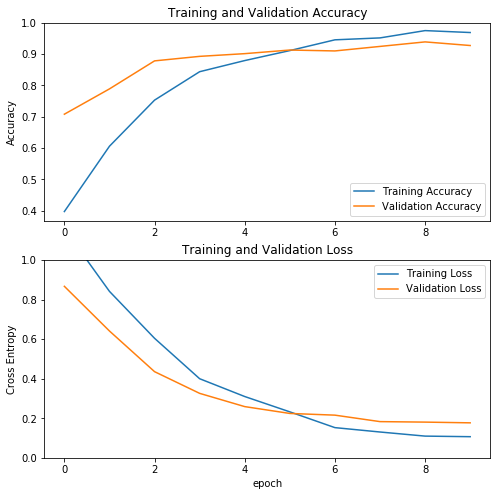

In [32]:
draw_charts(history)

Większa sieć z większym klasyfikatorem uczy się znacznie lepiej zwłaszcza odróżniać podobne klasy

In [33]:
wirdo_image_generator = tf.keras.preprocessing.image.ImageDataGenerator(
    rescale=1./255,
    horizontal_flip = True,
    fill_mode = "nearest",
    zoom_range = 0.3,
    width_shift_range = 0.3,
    height_shift_range=0.3,
    rotation_range=30)

train_data_gen = wirdo_image_generator.flow_from_directory(directory=str(train_data_dir),
                                                     batch_size=BATCH_SIZE,
                                                     shuffle=True,
                                                     target_size=(IMG_HEIGHT, IMG_WIDTH),
                                                     classes = list(CLASS_NAMES))
valid_data_gen = image_generator.flow_from_directory(directory=str(valid_data_dir),
                                                     target_size=(IMG_HEIGHT, IMG_WIDTH),
                                                     classes = list(CLASS_NAMES))

Found 814 images belonging to 3 classes.
Found 346 images belonging to 3 classes.


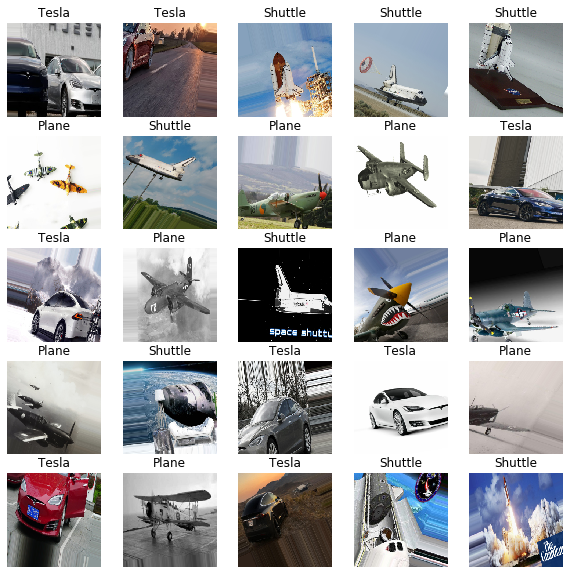

In [34]:
show_batch(*next(train_data_gen))

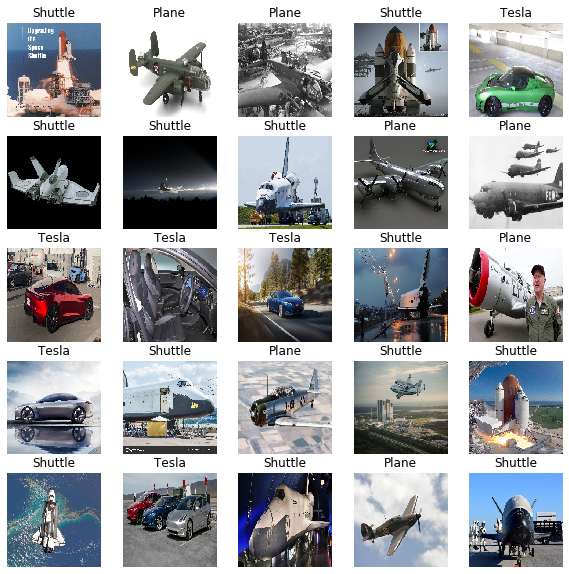

In [35]:
show_batch(*next(valid_data_gen))

In [36]:
model = keras.applications.VGG19(weights = "imagenet", include_top=False, input_shape = (IMG_HEIGHT, IMG_WIDTH, 3))
for layer in model.layers[:5]:
    layer.trainable = False

x = model.output
x = keras.layers.Flatten()(x)
x = keras.layers.Dense(1024, activation="relu")(x)
x = keras.layers.Dropout(0.5)(x)
x = keras.layers.Dense(1024, activation="relu")(x)
predictions = keras.layers.Dense(3, activation="softmax")(x)

model_4 = keras.models.Model(inputs = model.input, outputs = predictions)
model_4.compile(loss = "categorical_crossentropy", optimizer = keras.optimizers.SGD(lr=0.0001, momentum=0.9), metrics=["accuracy"])
history = model_4.fit(train_data_gen,
                    epochs=10,
                    validation_data=valid_data_gen)

model_4

  ...
    to  
  ['...']
  ...
    to  
  ['...']
Train for 26 steps, validate for 11 steps
Epoch 1/10


/usr/local/lib/python3.6/dist-packages/PIL/Image.py:914: UserWarning: Palette images with Transparency   expressed in bytes should be converted to RGBA images
  'to RGBA images')


26/26 [==============================] - 37s 1s/step - loss: 1.1906 - accuracy: 0.3268 - val_loss: 0.9975 - val_accuracy: 0.5636
Epoch 2/10
26/26 [==============================] - 36s 1s/step - loss: 1.0660 - accuracy: 0.4251 - val_loss: 0.8992 - val_accuracy: 0.5954
Epoch 3/10
26/26 [==============================] - 36s 1s/step - loss: 0.9710 - accuracy: 0.5246 - val_loss: 0.7753 - val_accuracy: 0.6879
Epoch 4/10
26/26 [==============================] - 36s 1s/step - loss: 0.8627 - accuracy: 0.6044 - val_loss: 0.6810 - val_accuracy: 0.7312
Epoch 5/10
26/26 [==============================] - 36s 1s/step - loss: 0.7816 - accuracy: 0.6204 - val_loss: 0.4841 - val_accuracy: 0.8382
Epoch 6/10
26/26 [==============================] - 36s 1s/step - loss: 0.6446 - accuracy: 0.6916 - val_loss: 0.4524 - val_accuracy: 0.8064
Epoch 7/10
26/26 [==============================] - 36s 1s/step - loss: 0.6109 - accuracy: 0.7125 - val_loss: 0.3504 - val_accuracy: 0.8526
Epoch 8/10
26/26 [=============

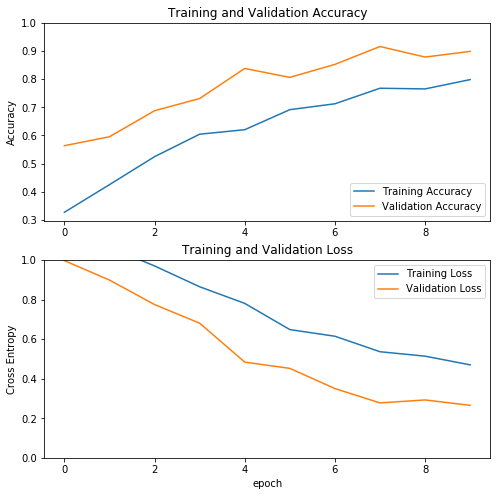

In [37]:
draw_charts(history)

Momo zniekształconego wejścia sieć ciągle dobrze się uczy, choć wolniej niż dla niezniekształconego wejścia

Found 346 images belonging to 3 classes.


/usr/local/lib/python3.6/dist-packages/PIL/Image.py:914: UserWarning: Palette images with Transparency   expressed in bytes should be converted to RGBA images
  'to RGBA images')


shuttle expected to be plane


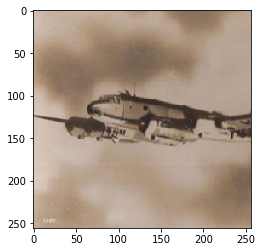

shuttle expected to be plane


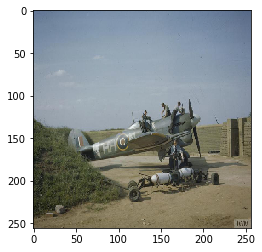

shuttle expected to be plane


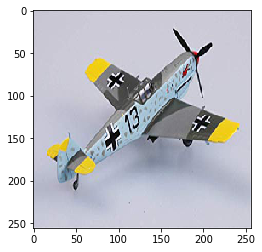

shuttle expected to be plane


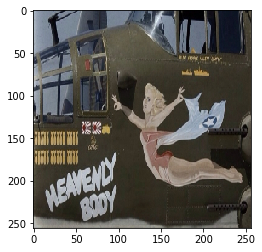

tesla expected to be plane


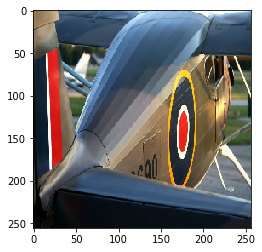

shuttle expected to be plane


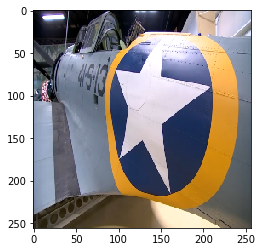

shuttle expected to be tesla


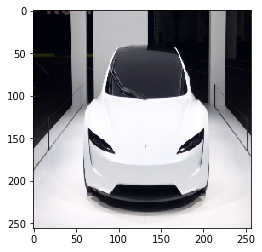

plane expected to be shuttle


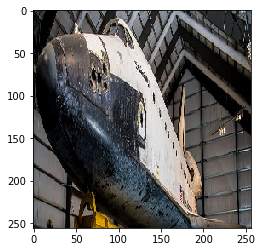

shuttle expected to be plane


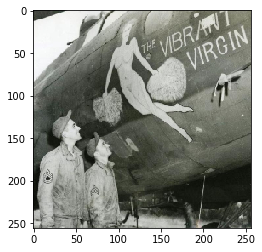

shuttle expected to be plane


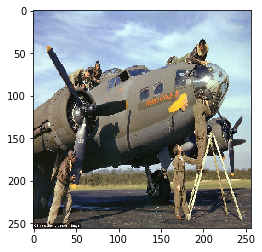

shuttle expected to be plane


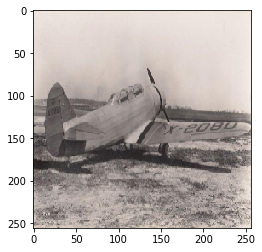

shuttle expected to be plane


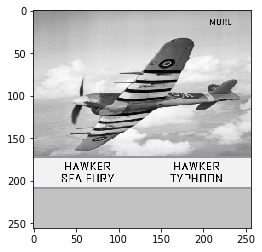

shuttle expected to be plane


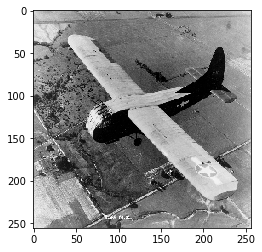

shuttle expected to be plane


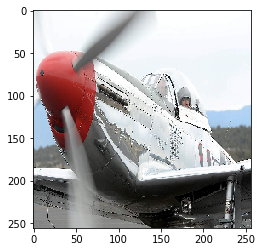

shuttle expected to be plane


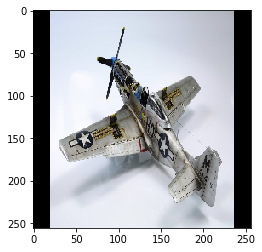

shuttle expected to be tesla


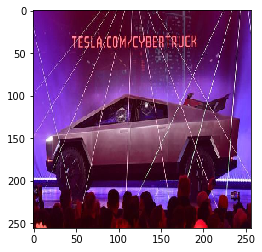

shuttle expected to be plane


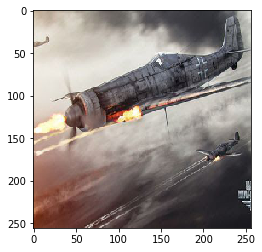

shuttle expected to be plane


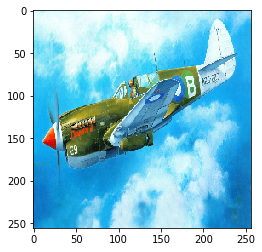

shuttle expected to be plane


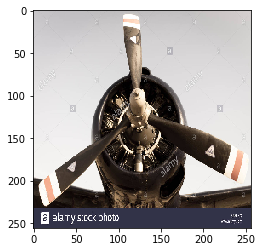

shuttle expected to be plane


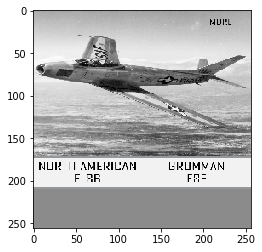

shuttle expected to be plane


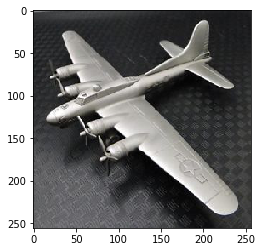

shuttle expected to be plane


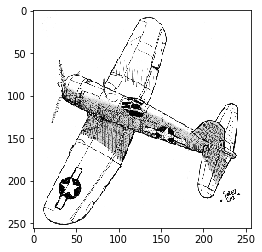

shuttle expected to be plane


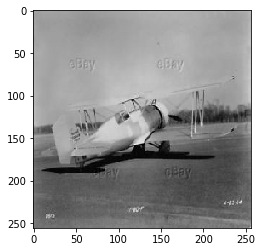

plane expected to be shuttle


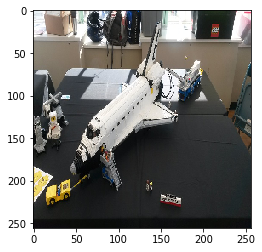

shuttle expected to be plane


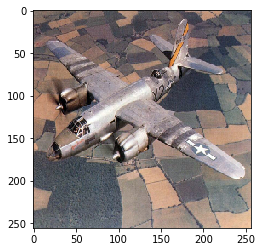

In [39]:
valid_data_gen = image_generator.flow_from_directory(directory=str(valid_data_dir),
                                                     batch_size=346,
                                                     shuffle=True,
                                                     target_size=(IMG_HEIGHT, IMG_WIDTH),
                                                     classes = list(CLASS_NAMES))
a,b= next(valid_data_gen)
n_preds = model_1.predict_classes(a)
preds = n_preds != np.argmax(b,axis=1)
claz = {0:'plane',1:'tesla',2:'shuttle'}
for img,nn_prediction,expected in zip(a[preds],n_preds[preds],np.argmax(b,axis=1)[preds]):
  print(f'{claz[nn_prediction]} expected to be {claz[expected]}')
  plt.imshow(img)
  plt.show()

Found 346 images belonging to 3 classes.


/usr/local/lib/python3.6/dist-packages/PIL/Image.py:914: UserWarning: Palette images with Transparency   expressed in bytes should be converted to RGBA images
  'to RGBA images')


shuttle expected to be plane


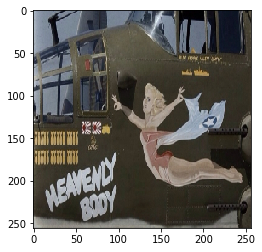

shuttle expected to be plane


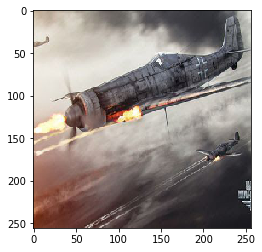

shuttle expected to be plane


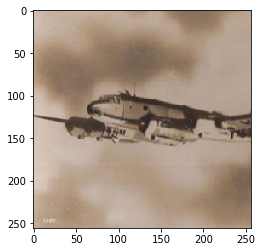

shuttle expected to be plane


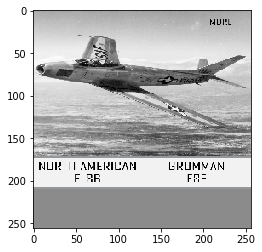

shuttle expected to be plane


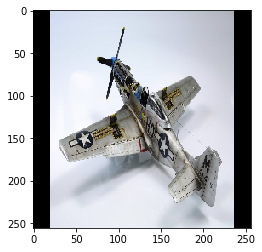

shuttle expected to be plane


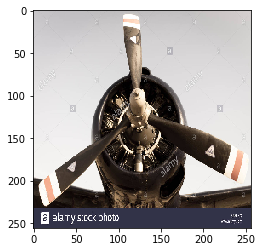

shuttle expected to be plane


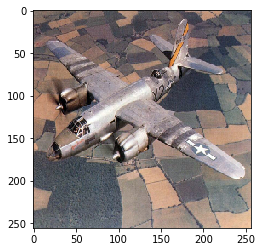

shuttle expected to be plane


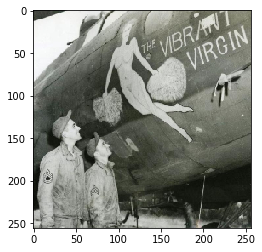

shuttle expected to be tesla


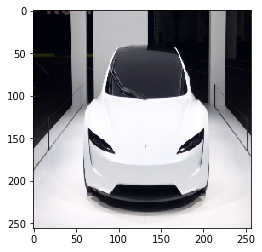

shuttle expected to be plane


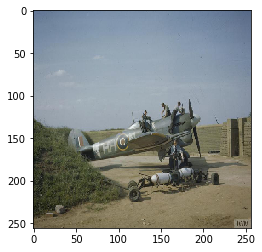

shuttle expected to be plane


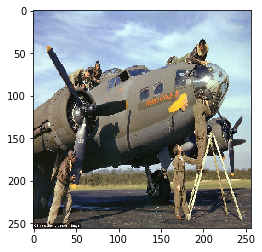

shuttle expected to be plane


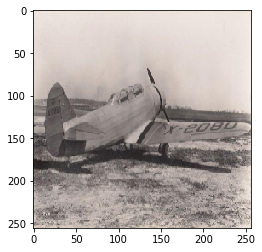

shuttle expected to be plane


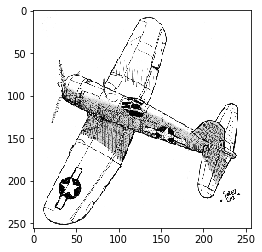

shuttle expected to be plane


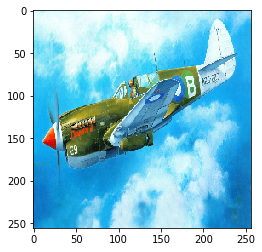

shuttle expected to be plane


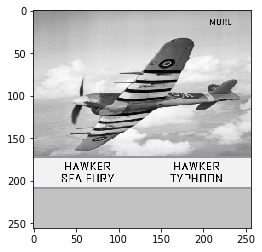

tesla expected to be plane


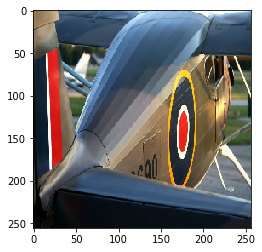

shuttle expected to be tesla


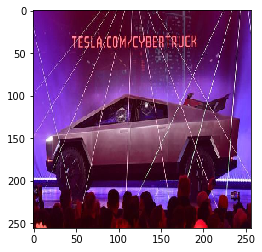

shuttle expected to be plane


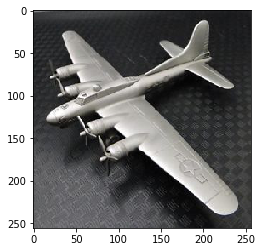

shuttle expected to be plane


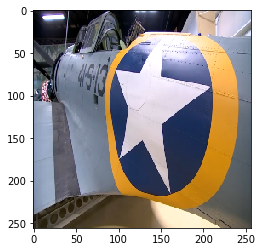

shuttle expected to be plane


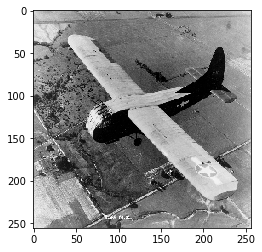

shuttle expected to be plane


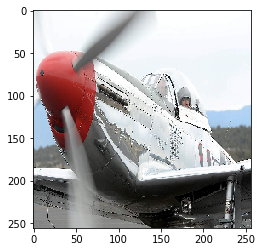

plane expected to be shuttle


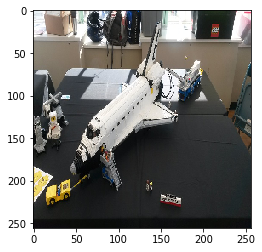

plane expected to be shuttle


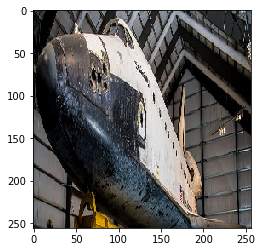

shuttle expected to be plane


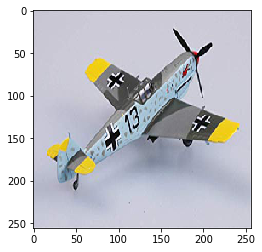

shuttle expected to be plane


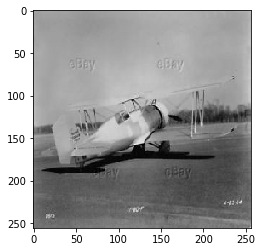

In [40]:
valid_data_gen = image_generator.flow_from_directory(directory=str(valid_data_dir),
                                                     batch_size=346,
                                                     shuffle=True,
                                                     target_size=(IMG_HEIGHT, IMG_WIDTH),
                                                     classes = list(CLASS_NAMES))
a,b= next(valid_data_gen)
n_preds = model_2.predict_classes(a)
preds = n_preds != np.argmax(b,axis=1)
claz = {0:'plane',1:'tesla',2:'shuttle'}
for img,nn_prediction,expected in zip(a[preds],n_preds[preds],np.argmax(b,axis=1)[preds]):
  print(f'{claz[nn_prediction]} expected to be {claz[expected]}')
  plt.imshow(img)
  plt.show()

Found 346 images belonging to 3 classes.


/usr/local/lib/python3.6/dist-packages/PIL/Image.py:914: UserWarning: Palette images with Transparency   expressed in bytes should be converted to RGBA images
  'to RGBA images')


plane expected to be shuttle


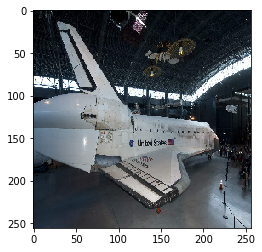

shuttle expected to be plane


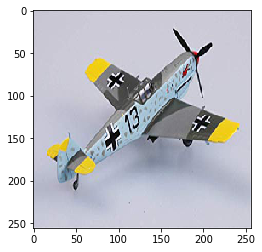

shuttle expected to be plane


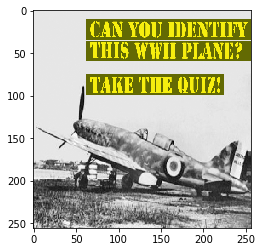

shuttle expected to be plane


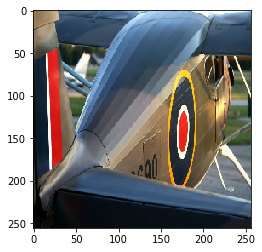

plane expected to be shuttle


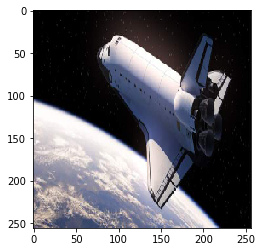

plane expected to be tesla


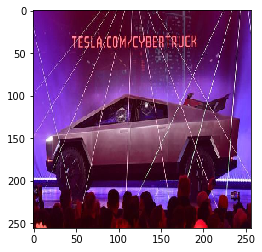

plane expected to be shuttle


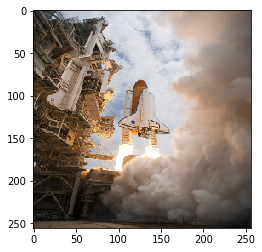

shuttle expected to be plane


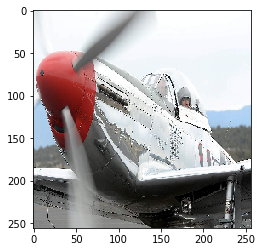

plane expected to be shuttle


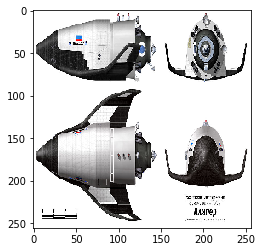

plane expected to be tesla


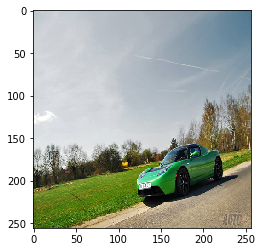

shuttle expected to be plane


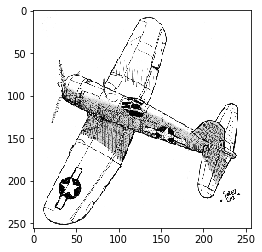

plane expected to be shuttle


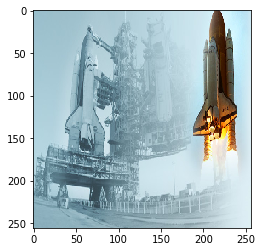

plane expected to be tesla


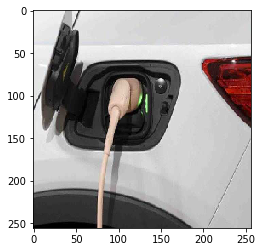

plane expected to be shuttle


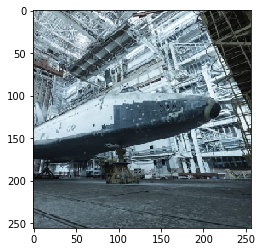

plane expected to be shuttle


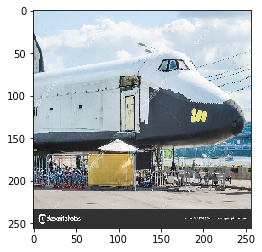

plane expected to be shuttle


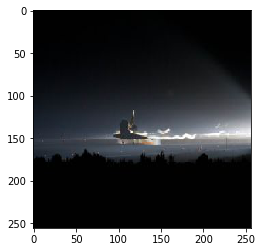

shuttle expected to be plane


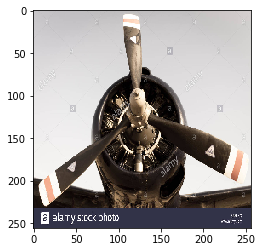

shuttle expected to be plane


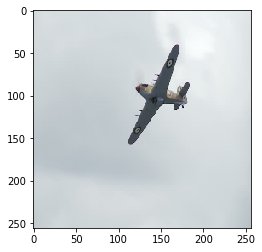

shuttle expected to be plane


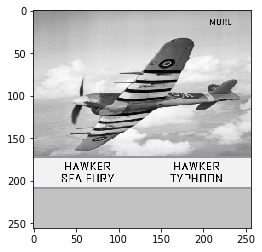

plane expected to be tesla


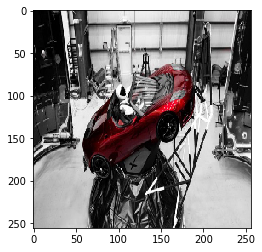

tesla expected to be shuttle


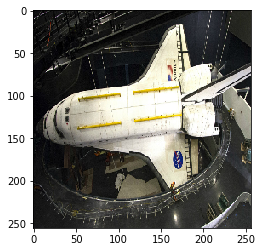

tesla expected to be plane


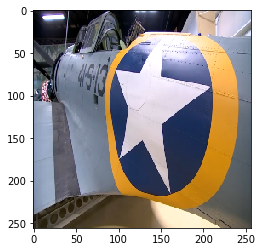

plane expected to be shuttle


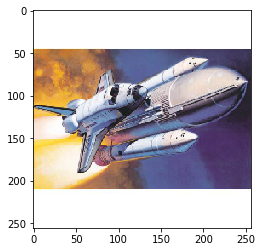

tesla expected to be shuttle


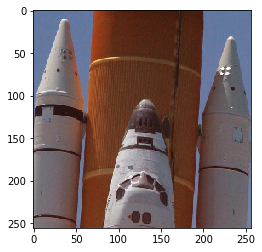

tesla expected to be shuttle


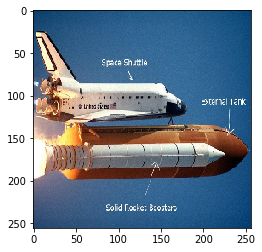

In [41]:
valid_data_gen = image_generator.flow_from_directory(directory=str(valid_data_dir),
                                                     batch_size=346,
                                                     shuffle=True,
                                                     target_size=(IMG_HEIGHT, IMG_WIDTH),
                                                     classes = list(CLASS_NAMES))
a,b= next(valid_data_gen)
n_preds = model_3.predict(a)
n_preds = np.argmax(n_preds,axis=1)
preds = n_preds != np.argmax(b,axis=1)
claz = {0:'plane',1:'tesla',2:'shuttle'}
for img,nn_prediction,expected in zip(a[preds],n_preds[preds],np.argmax(b,axis=1)[preds]):
  print(f'{claz[nn_prediction]} expected to be {claz[expected]}')
  plt.imshow(img)
  plt.show()

Found 814 images belonging to 3 classes.


/usr/local/lib/python3.6/dist-packages/PIL/Image.py:914: UserWarning: Palette images with Transparency   expressed in bytes should be converted to RGBA images
  'to RGBA images')


shuttle expected to be plane


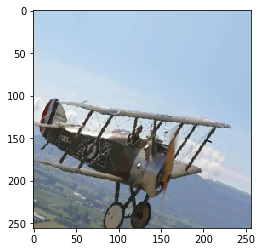

shuttle expected to be tesla


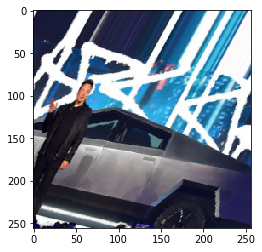

shuttle expected to be plane


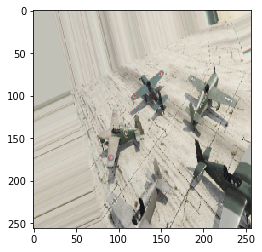

tesla expected to be plane


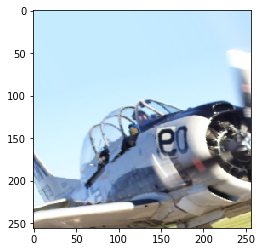

shuttle expected to be plane


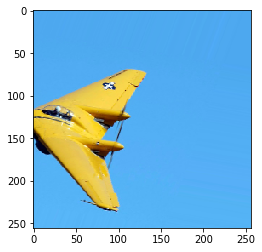

shuttle expected to be plane


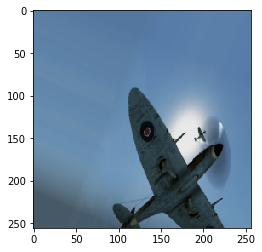

shuttle expected to be plane


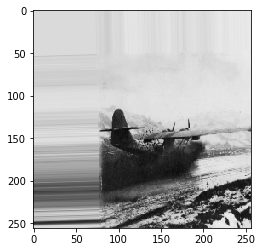

shuttle expected to be plane


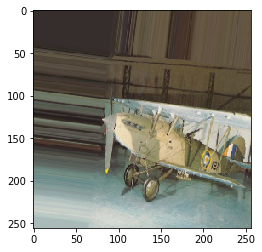

shuttle expected to be plane


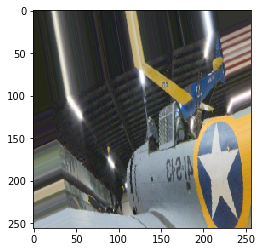

shuttle expected to be tesla


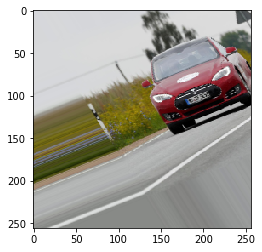

shuttle expected to be tesla


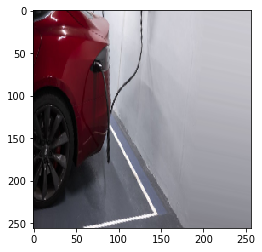

shuttle expected to be plane


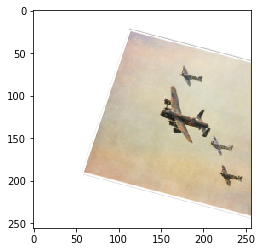

shuttle expected to be plane


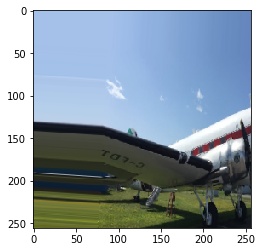

shuttle expected to be tesla


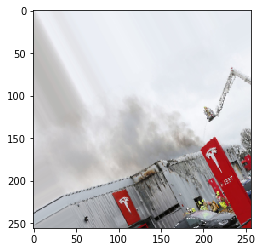

tesla expected to be plane


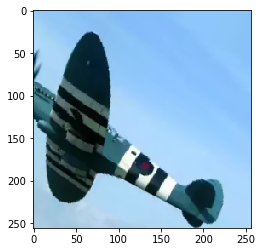

shuttle expected to be plane


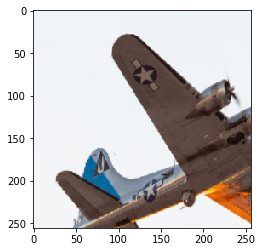

shuttle expected to be plane


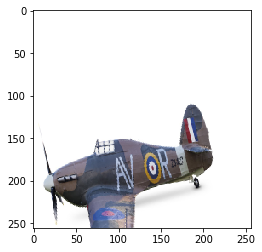

shuttle expected to be plane


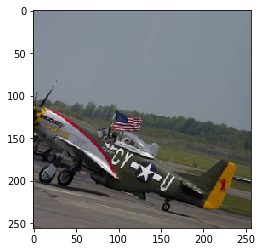

shuttle expected to be plane


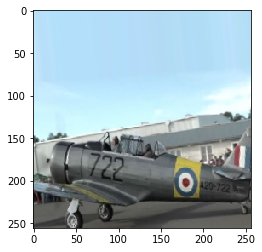

shuttle expected to be plane


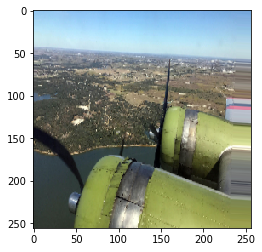

shuttle expected to be plane


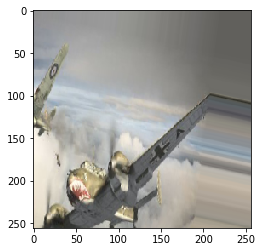

shuttle expected to be plane


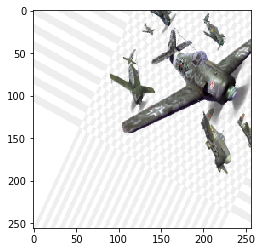

shuttle expected to be tesla


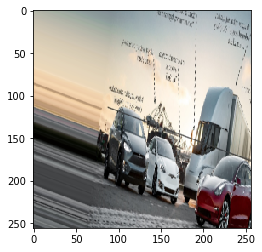

shuttle expected to be tesla


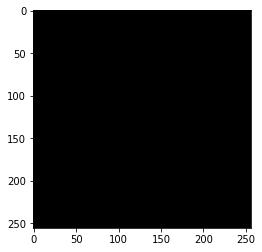

shuttle expected to be plane


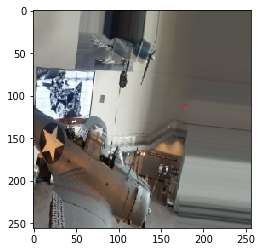

shuttle expected to be plane


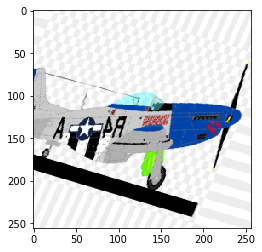

shuttle expected to be plane


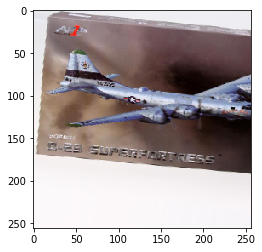

tesla expected to be plane


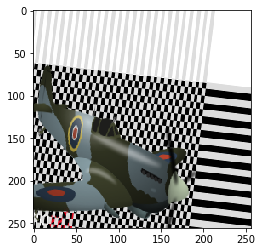

shuttle expected to be plane


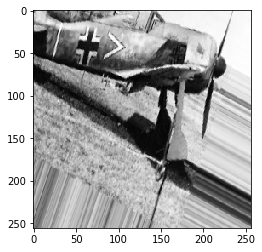

shuttle expected to be plane


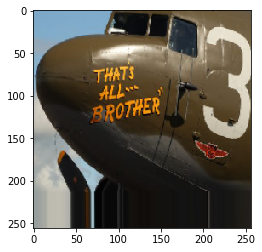

shuttle expected to be plane


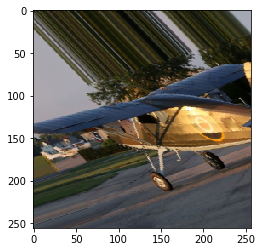

tesla expected to be plane


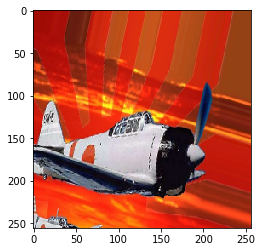

tesla expected to be plane


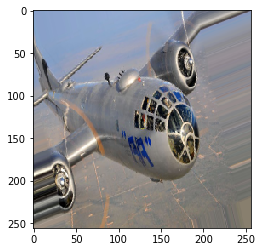

shuttle expected to be tesla


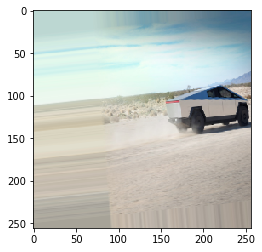

shuttle expected to be plane


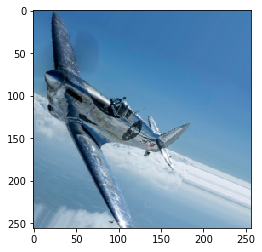

shuttle expected to be plane


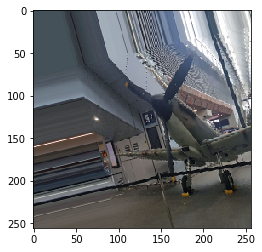

shuttle expected to be plane


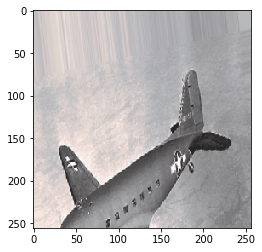

shuttle expected to be tesla


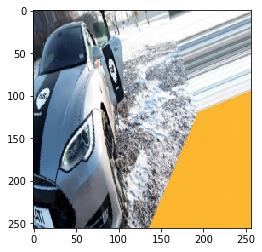

shuttle expected to be plane


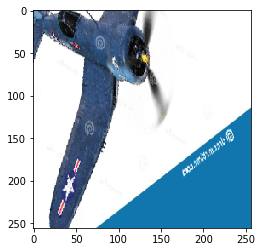

shuttle expected to be plane


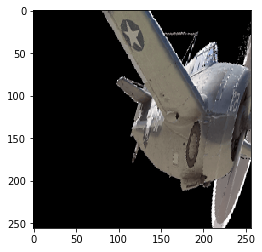

shuttle expected to be plane


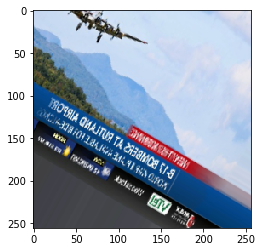

shuttle expected to be plane


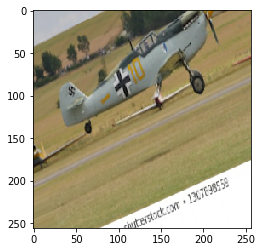

shuttle expected to be plane


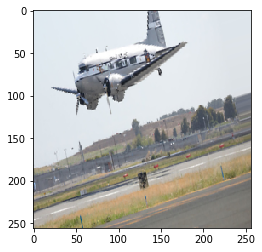

shuttle expected to be tesla


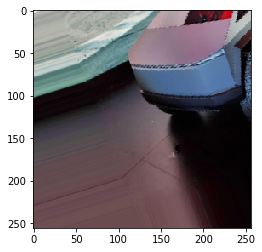

tesla expected to be shuttle


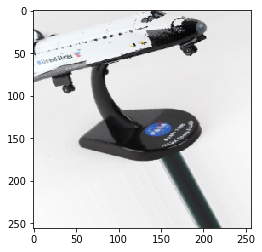

shuttle expected to be plane


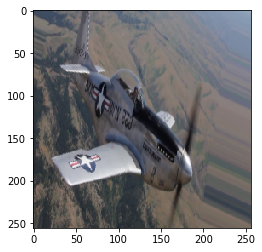

shuttle expected to be tesla


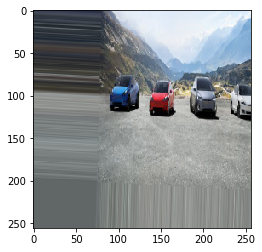

plane expected to be shuttle


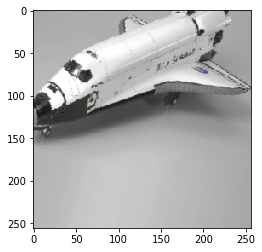

shuttle expected to be plane


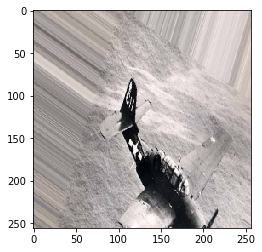

plane expected to be shuttle


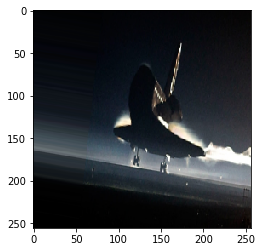

shuttle expected to be plane


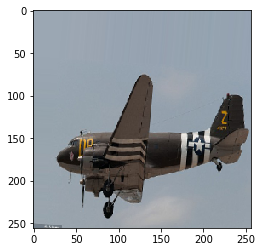

shuttle expected to be plane


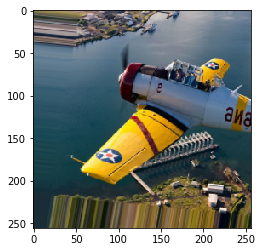

tesla expected to be shuttle


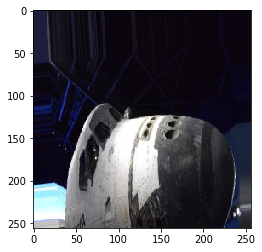

shuttle expected to be plane


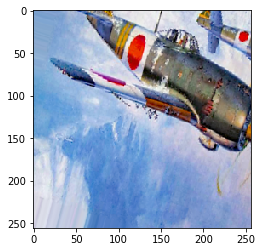

shuttle expected to be plane


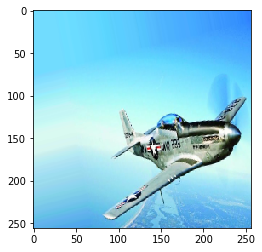

shuttle expected to be plane


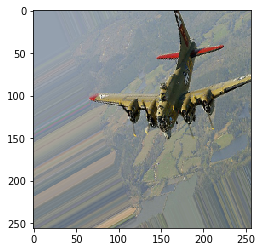

shuttle expected to be plane


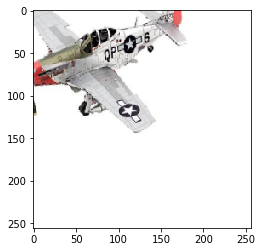

plane expected to be shuttle


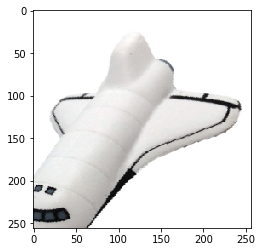

shuttle expected to be plane


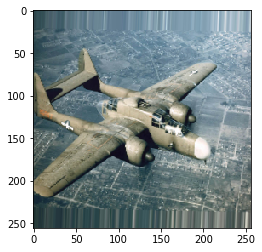

shuttle expected to be tesla


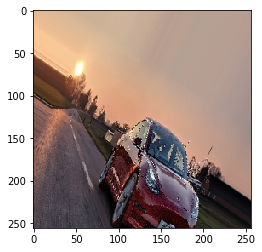

shuttle expected to be plane


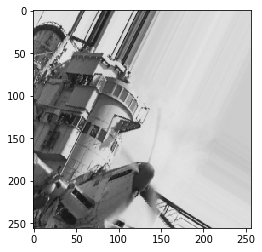

shuttle expected to be tesla


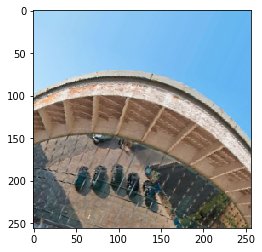

shuttle expected to be plane


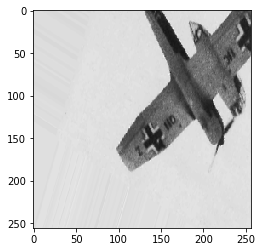

shuttle expected to be plane


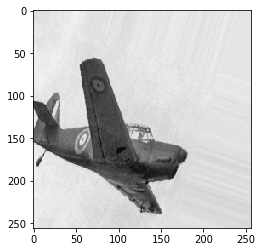

shuttle expected to be plane


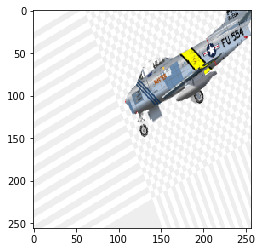

shuttle expected to be plane


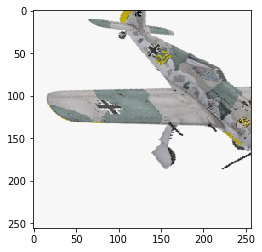

shuttle expected to be plane


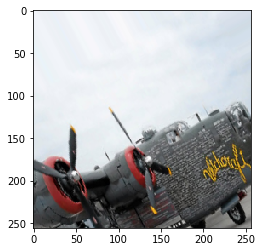

In [42]:
valid_data_gen = wirdo_image_generator.flow_from_directory(directory=str(train_data_dir),
                                                     batch_size=346,
                                                     shuffle=True,
                                                     target_size=(IMG_HEIGHT, IMG_WIDTH),
                                                     classes = list(CLASS_NAMES))
a,b= next(valid_data_gen)
n_preds = model_4.predict(a)
n_preds = np.argmax(n_preds,axis=1)
preds = n_preds != np.argmax(b,axis=1)
claz = {0:'plane',1:'tesla',2:'shuttle'}
for img,nn_prediction,expected in zip(a[preds],n_preds[preds],np.argmax(b,axis=1)[preds]):
  print(f'{claz[nn_prediction]} expected to be {claz[expected]}')
  plt.imshow(img)
  plt.show()

Jak widać najczęstrze błędy to pomylenie samolotu z promem kosmicznym co nie dziwi z uwagi na to że klasy te są bardzo podobne

In [0]:
valid_data_dir = '/content/dirve/My Drive/Colab Notebooks/TransferLearningData/c_test'
train_data_dir = '/content/dirve/My Drive/Colab Notebooks/TransferLearningData/c_train'
valid_data_dir = pathlib.Path(valid_data_dir)
train_data_dir = pathlib.Path(train_data_dir)

In [70]:
train_data_gen = image_generator.flow_from_directory(directory=str(train_data_dir),
                                                     batch_size=BATCH_SIZE,
                                                     shuffle=True,
                                                     target_size=(IMG_HEIGHT, IMG_WIDTH))
valid_data_gen = image_generator.flow_from_directory(directory=str(valid_data_dir),
                                                     target_size=(IMG_HEIGHT, IMG_WIDTH))

Found 387 images belonging to 2 classes.
Found 193 images belonging to 2 classes.


In [71]:
CLASS_NAMES = np.array([item.name for item in train_data_dir.glob('*')])
CLASS_NAMES

array(['edward', 'jabami'], dtype='<U6')

In [0]:
image_batch, label_batch = next(train_data_gen)

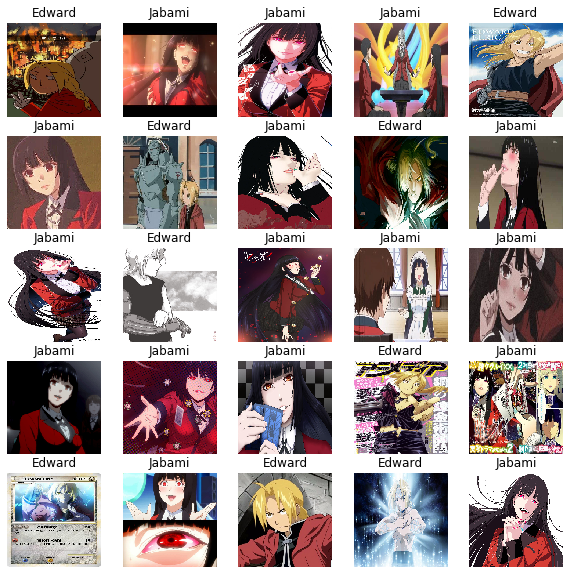

In [73]:
show_batch(image_batch,label_batch)

In [74]:
model = keras.applications.VGG19(weights = "imagenet", include_top=False, input_shape = (IMG_HEIGHT, IMG_WIDTH, 3))
for layer in model.layers[:5]:
    layer.trainable = False

x = model.output
x = keras.layers.Flatten()(x)
x = keras.layers.Dense(1024, activation="relu")(x)
x = keras.layers.Dropout(0.5)(x)
x = keras.layers.Dense(1024, activation="relu")(x)
predictions = keras.layers.Dense(2, activation="softmax")(x)

model_5 = keras.models.Model(inputs = model.input, outputs = predictions)
model_5.compile(loss = "categorical_crossentropy", optimizer = keras.optimizers.SGD(lr=0.0001, momentum=0.9), metrics=["accuracy"])
history = model_5.fit(train_data_gen,
                    epochs=10,
                    validation_data=valid_data_gen)

  ...
    to  
  ['...']
  ...
    to  
  ['...']
Train for 13 steps, validate for 7 steps
Epoch 1/10
 3/13 [=====>........................] - ETA: 10s - loss: 0.8001 - accuracy: 0.5373

/usr/local/lib/python3.6/dist-packages/PIL/Image.py:914: UserWarning: Palette images with Transparency   expressed in bytes should be converted to RGBA images
  'to RGBA images')


 5/13 [==========>...................] - ETA: 7s - loss: 0.7805 - accuracy: 0.5267

/usr/local/lib/python3.6/dist-packages/PIL/TiffImagePlugin.py:742: UserWarning: Corrupt EXIF data.  Expecting to read 4 bytes but only got 0. 
  warnings.warn(str(msg))


13/13 [==============================] - 16s 1s/step - loss: 0.7609 - accuracy: 0.5116 - val_loss: 0.7485 - val_accuracy: 0.5285
Epoch 2/10
13/13 [==============================] - 15s 1s/step - loss: 0.6834 - accuracy: 0.5840 - val_loss: 0.6329 - val_accuracy: 0.7202
Epoch 3/10
13/13 [==============================] - 15s 1s/step - loss: 0.6182 - accuracy: 0.6357 - val_loss: 0.5638 - val_accuracy: 0.7876
Epoch 4/10
13/13 [==============================] - 15s 1s/step - loss: 0.5732 - accuracy: 0.6925 - val_loss: 0.5257 - val_accuracy: 0.8031
Epoch 5/10
13/13 [==============================] - 15s 1s/step - loss: 0.4928 - accuracy: 0.7571 - val_loss: 0.4603 - val_accuracy: 0.8290
Epoch 6/10
13/13 [==============================] - 15s 1s/step - loss: 0.4369 - accuracy: 0.7829 - val_loss: 0.4054 - val_accuracy: 0.8601
Epoch 7/10
13/13 [==============================] - 15s 1s/step - loss: 0.3943 - accuracy: 0.8320 - val_loss: 0.3611 - val_accuracy: 0.8653
Epoch 8/10
13/13 [=============

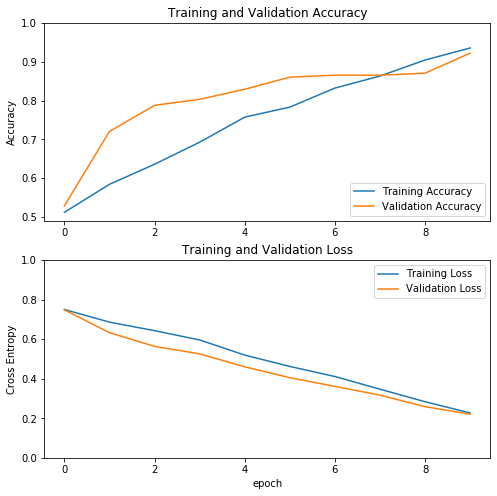

In [75]:
draw_charts(history)

Found 193 images belonging to 2 classes.


/usr/local/lib/python3.6/dist-packages/PIL/TiffImagePlugin.py:742: UserWarning: Corrupt EXIF data.  Expecting to read 4 bytes but only got 0. 
  warnings.warn(str(msg))


jabami expected to be edward


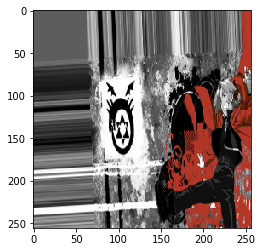

jabami expected to be edward


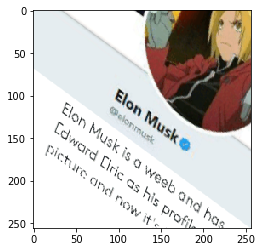

jabami expected to be edward


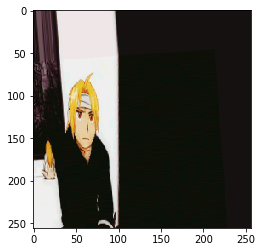

edward expected to be jabami


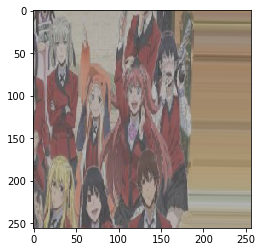

jabami expected to be edward


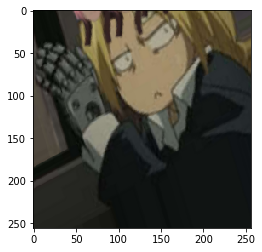

edward expected to be jabami


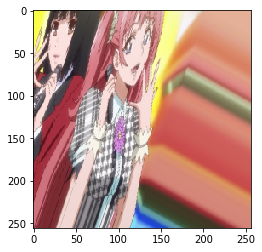

jabami expected to be edward


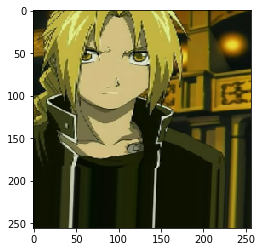

jabami expected to be edward


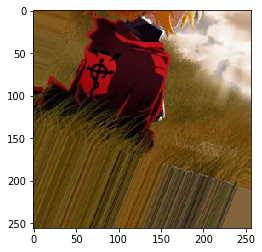

jabami expected to be edward


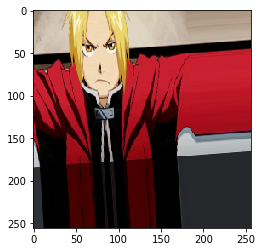

edward expected to be jabami


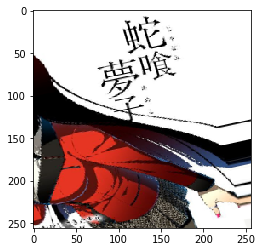

jabami expected to be edward


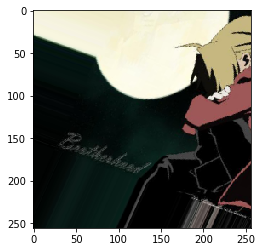

edward expected to be jabami


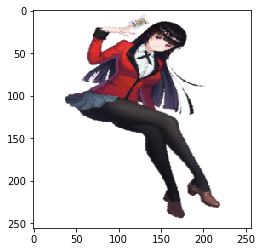

jabami expected to be edward


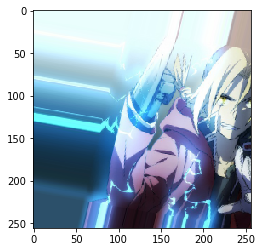

jabami expected to be edward


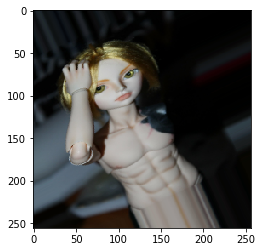

edward expected to be jabami


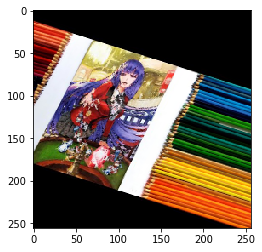

jabami expected to be edward


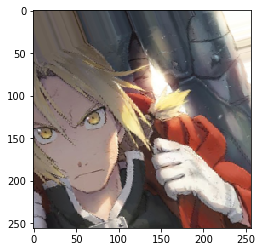

jabami expected to be edward


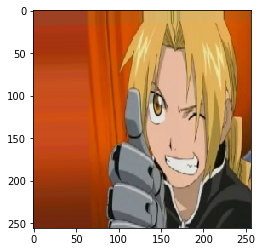

jabami expected to be edward


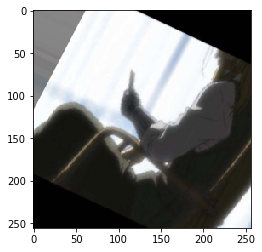

jabami expected to be edward


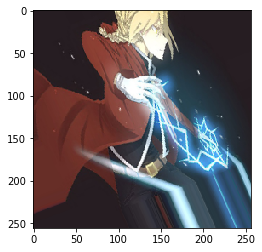

edward expected to be jabami


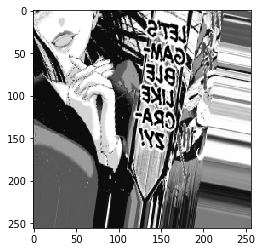

jabami expected to be edward


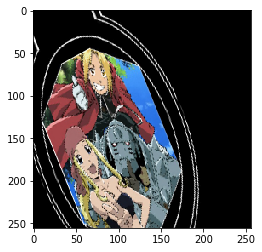

jabami expected to be edward


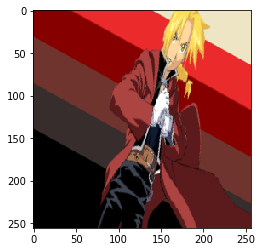

jabami expected to be edward


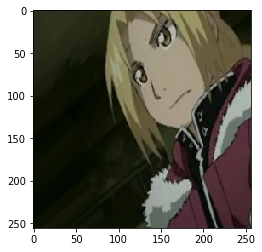

jabami expected to be edward


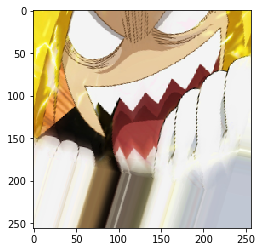

jabami expected to be edward


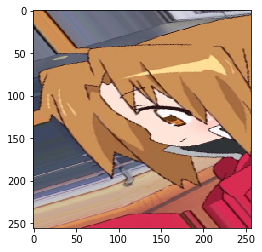

jabami expected to be edward


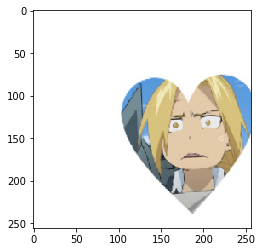

jabami expected to be edward


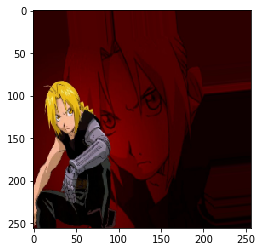

edward expected to be jabami


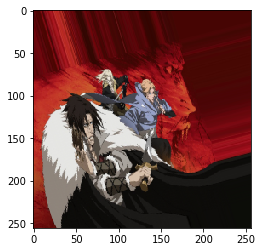

jabami expected to be edward


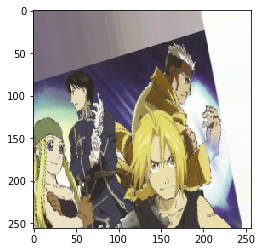

jabami expected to be edward


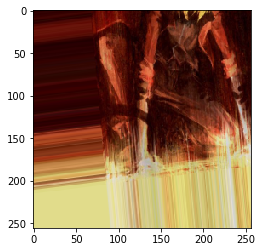

edward expected to be jabami


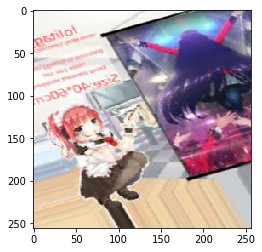

edward expected to be jabami


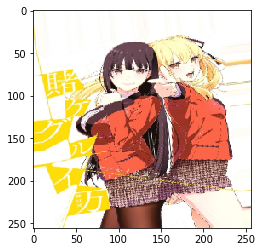

jabami expected to be edward


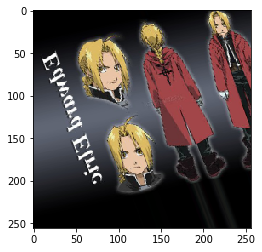

jabami expected to be edward


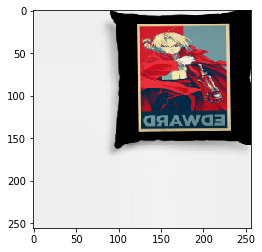

jabami expected to be edward


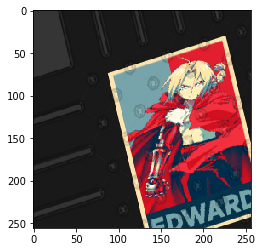

edward expected to be jabami


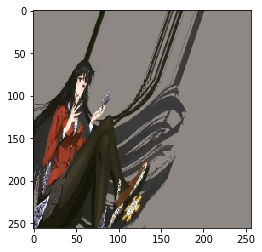

jabami expected to be edward


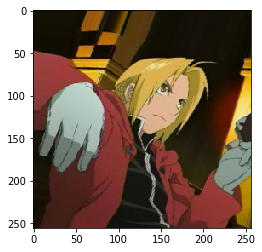

edward expected to be jabami


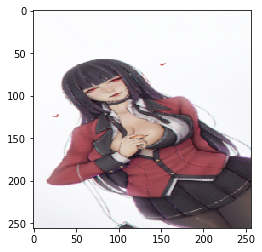

jabami expected to be edward


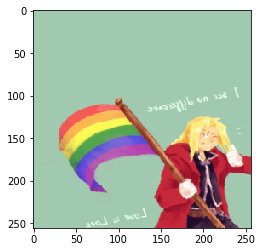

jabami expected to be edward


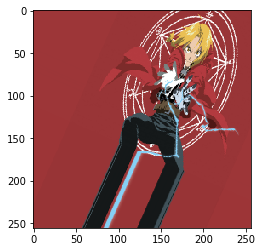

In [76]:
valid_data_gen = wirdo_image_generator.flow_from_directory(directory=str(valid_data_dir),
                                                     batch_size=202,
                                                     shuffle=True,
                                                     target_size=(IMG_HEIGHT, IMG_WIDTH))
a,b= next(valid_data_gen)
n_preds = model_5.predict(a)
n_preds = np.argmax(n_preds,axis=1)
preds = n_preds != np.argmax(b,axis=1)
claz = {0:'edward',1:'jabami'}
for img,nn_prediction,expected in zip(a[preds],n_preds[preds],np.argmax(b,axis=1)[preds]):
  print(f'{claz[nn_prediction]} expected to be {claz[expected]}')
  plt.imshow(img)
  plt.show()

Sieć nie uczy się do tak wysokiego poziomu jak poprzednio